In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import nltk

from nltk.sentiment import SentimentIntensityAnalyzer
from PIL import Image
from wordcloud import WordCloud, ImageColorGenerator

from textblob import TextBlob

from truecase import get_true_case
import spacy
nlp = spacy.load('en_core_web_sm')
from collections import Counter

from os.path import join

from utils import stop_words, make_corpus_df, get_data_between_dates, get_data_by_year, get_data_by_channel, make_list_of_processed_snippets, create_document, NETWORKS, STATIONS

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/dylanlewis/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/dylanlewis/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/dylanlewis/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
PARENT = 'TelevisionNewsV2'
TFIDF_PLOT_DIR = './plots/tfidf_analysis'
NETWORK_MAP = {
    'CNN': 'cnn',
    'Fox News': 'foxnews',
    'MSNBC': 'msnbc'
}
COLOR_MAP = {
    'CNN': 'blue',
    'Fox News': 'orange',
    'MSNBC': 'green'
}

In [3]:
corpus_df = make_corpus_df(PARENT)
corpus_df = corpus_df[['DateTime', 'Station', 'Show', 'IAShowID', 'Snippet']]
unprocessed_corpus_df = corpus_df.copy()
corpus_df['Snippet'] = make_list_of_processed_snippets(corpus_df, stop_words)

In [244]:
_2019_data = get_data_by_year(corpus_df, 2019)
_2020_data = get_data_by_year(corpus_df, 2020)
final_years_df = pd.concat([_2019_data, _2020_data])
years = [str(i) for i in range(2009, 2019)]
years.append("2019+2020")
years_mod = years.copy()
years_mod[-1] = '19+20'

# TF-IDF Analysis

The TF-IDF statistic provides an effective way to hone in on words that are important for a document (snippets or set of snippets) while also taking into account how prevalent a word is across all the documents in a corpus. We construct our documents at different levels of granularity to uncover the most important words to each document, namely we have looked at the TF-IDF when the documents are the entirety of the snippets for a given network, i.e. one document for CNN snippets, one document for Fox News snippets, and another for MSNBC snippets. After constructing the TF-IDF featurization for our documents, for each document, we select the words which had the top 30 largest TF-IDF scores. At the level of the TV networks, we find that the most interesting finding is that  CNN & MSNBC which are more liberal-leaning networks have a higher TF-IDF score for Trump than FOX does which is conservative-leaning network. Additionally, Fox News has a higher TF-IDF score for Obama than the liberal networks.

In [210]:
# documents_list is a list of strings, where each string is preprocessed document (e.g. preprocessed snippet).
def fit_tfidf_vectorizer(documents_list):
    vectorizer = TfidfVectorizer()
    vectorized_document_array = vectorizer.fit_transform(documents_list).toarray()
    print(vectorizer.idf_)
    features_array = np.array(vectorizer.get_feature_names())
    return vectorized_document_array, features_array

def get_tfidf_for_word_across_docs(word, vectorized_document_array, features_array):
    word_vector_index_array = np.where(features_array == word)[0]
    if len(word_vector_index_array) == 0:
        print("Word {} not present in any documents.".format(word))
        return
    else:
        word_vector_index = word_vector_index_array.item()
        # document ordered vector of tf-idf scores for the requested word
        word_vector = vectorized_document_array[:, word_vector_index]
        return word_vector

def get_top_tfidf_words_per_document(n, vectorized_document_array, features_array):
    num_docs = vectorized_document_array.shape[0]
    top_words_list = []
    # I.e. the words which had the largest tf-idf scores for document i will be the list located 
    # at index i in top_words_list in descending order of tf-idf score.
    for i in range(num_docs):
        doc_tfidf_vector = vectorized_document_array[i, :]
        top_tfidf_doc_indices = doc_tfidf_vector.argsort()[::-1]
        top_n_tfidf_words_for_doc = features_array[top_tfidf_doc_indices][:n]
        top_n_word_tfidf_scores_for_doc = np.sort(doc_tfidf_vector)[::-1][:n]
        top_n_words_tfidf_list_for_doc = [(word, tfidf) for word, tfidf in zip(top_n_tfidf_words_for_doc,                                                            top_n_word_tfidf_scores_for_doc)]
        top_words_list.append(top_n_words_tfidf_list_for_doc)
    return top_words_list

def create_documents_by_years_and_by_network(df):
    first_10_years = range(2009, 2019)
    first_10_years_documents = [create_document(get_data_by_year(df, year)['Snippet'].tolist()) for year in first_10_years]
    _2019_data = get_data_by_year(corpus_df, 2019)
    _2020_data = get_data_by_year(corpus_df, 2020)
    final_years_df = pd.concat([_2019_data, _2020_data])
    final_years_document = create_document(final_years_df['Snippet'].tolist())

    years_with_network_documents = []
    for year in first_10_years:
        for network in NETWORKS:
            df_for_year_and_network = get_data_by_channel(get_data_by_year(df, year), network)
            snippets_list = df_for_year_and_network['Snippet'].tolist()
            years_with_network_documents.append(create_document(snippets_list))
    # deal with 2019 + 2020
    for network in NETWORKS:
        final_year_with_network_df = get_data_by_channel(final_years_df, network)
        snippets_list = final_year_with_network_df['Snippet'].tolist()
        years_with_network_documents.append(create_document(snippets_list))
    
    return years_with_network_documents

def create_documents_by_network_and_by_year(df):
    first_10_years = range(2009, 2019)
    first_10_years_documents = [create_document(get_data_by_year(df, year)['Snippet'].tolist()) for year in first_10_years]
    _2019_data = get_data_by_year(corpus_df, 2019)
    _2020_data = get_data_by_year(corpus_df, 2020)
    final_years_df = pd.concat([_2019_data, _2020_data])
    final_years_document = create_document(final_years_df['Snippet'].tolist())

    network_with_year_documents = []
    for network in NETWORKS:
        for year in first_10_years:
            df_for_network_and_year = get_data_by_channel(get_data_by_year(df, year), network)
            snippets_list = df_for_network_and_year['Snippet'].tolist()
            network_with_year_documents.append(create_document(snippets_list))
        # deal with 2019 + 2020
        final_year_with_network_df = get_data_by_channel(final_years_df, network)
        snippets_list = final_year_with_network_df['Snippet'].tolist()
        network_with_year_documents.append(create_document(snippets_list))
    
    return network_with_year_documents

def plot_word_cloud(freq_dict, title, title_font_size=35, file_save_path=TFIDF_PLOT_DIR):
    wc = WordCloud(background_color="black", scale=3, colormap='Set2', random_state=1)
    wc.generate_from_frequencies(freq_dict)
    fig = plt.figure(figsize=(12, 12))
    plt.axis("off")
    plt.imshow(wc, interpolation='bilinear')
    plt.title(title, fontsize=title_font_size)
    plt.tight_layout(pad=0)
    plt.savefig(file_save_path, bbox_inches="tight")
    plt.show()

def plot_word_freq_scores(words, freq_score, title, ylabel, file_save_path=TFIDF_PLOT_DIR):
    plt.figure(figsize=(10,5))
    plt.bar(words, freq_score)
    plt.ylabel(ylabel, fontsize=10)
    plt.xticks(rotation=75, fontsize=10)
    plt.title(title, fontsize=15)
    plt.savefig(file_save_path, bbox_inches="tight")
    plt.show()

def plot_bar_for_word(xlabels, yvalues, title, ylabel, file_save_path=TFIDF_PLOT_DIR):
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.bar(xlabels, yvalues)
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    plt.tight_layout()
    plt.savefig(file_save_path, bbox_inches="tight")
    plt.show()

def plot_cosine_similarity_heatmap(data_array, labels, title, textsizes, savefig, figsize=(10, 7), use_vmin=False):
    fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(data_array, cmap='viridis', vmin = 0 if use_vmin else data_array.min())
    threshold = data_array.max()*(8/10)
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel('Cosine Similarity', rotation=-90, va='bottom', fontsize=textsizes['cbar_text_size'])
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels, fontsize=textsizes['label_size'])
    ax.set_yticklabels(labels, fontsize=textsizes['label_size'])
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    for i in range(len(labels)):
        for j in range(len(labels)):
            text = ax.text(j, i, round(data_array[i, j], 2), ha="center", va="center", 
                           color="w" if data_array[i, j] < threshold else 'black')
    ax.set_title(title, fontsize=textsizes['title_size'])
    fig.tight_layout()
    fig.savefig(savefig)
    plt.show()

In [199]:
cnn_df, fox_df, msnbc_df = get_data_by_channel(corpus_df, 'CNN'), get_data_by_channel(corpus_df, 'FOXNEWS'), get_data_by_channel(corpus_df, 'MSNBC')

In [200]:
cnn_document = create_document(cnn_df['Snippet'].to_list())
fox_document = create_document(fox_df['Snippet'].to_list())
msnbc_document = create_document(msnbc_df['Snippet'].to_list())
network_doc_list = [cnn_document, fox_document, msnbc_document]

In [201]:
NETWORK_PLOT_DIR = join(TFIDF_PLOT_DIR, 'by_network')

In [202]:
n = 50

In [204]:
cosine_similarity_matrix_networks = cosine_similarity(vectorized_document_array_networks)
networks_txt_sizes = {'label_size': 15, 'title_size': 15, 'cbar_text_size': 10}

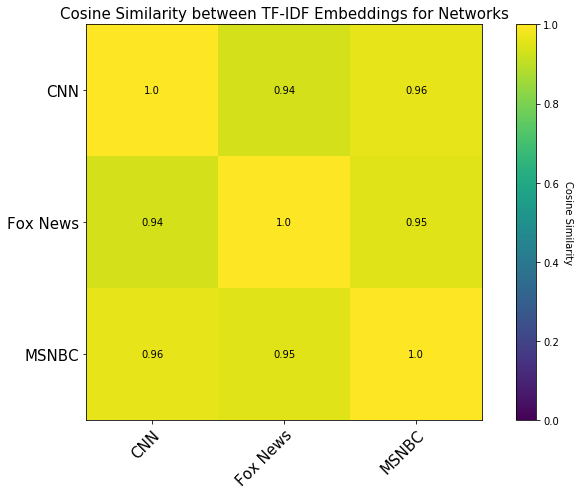

In [205]:
plot_cosine_similarity_heatmap(cosine_similarity_matrix_networks, STATIONS, "Cosine Similarity between TF-IDF Embeddings for Networks", networks_txt_sizes, join(NETWORK_PLOT_DIR, 'network_cosine_similarity.png'), use_vmin=True)

In [206]:
top_n_words_tfidf_by_network = get_top_tfidf_words_per_document(n, vectorized_document_array_networks, features_array_networks)
suptitle = f'Top {n} Words with Highest TF-IDF Scores by Network'

In [ ]:
# plot individual plots
for i, network in enumerate(STATIONS):
    top_n_words_tfidf_for_network = top_n_words_tfidf_by_network[i]
    top_n_words_tfidf_dict = {term: tfidf for term, tfidf in top_n_words_tfidf_for_network}
    top_n_tfidf_words = list(map(lambda x: x[0],top_n_words_tfidf_for_network))
    top_n_tfidf_scores = list(map(lambda x: x[1],top_n_words_tfidf_for_network))
    title = f"Top {n} Words with Highest TF-IDF Scores for {network}"
    plot_word_freq_scores(top_n_tfidf_words, top_n_tfidf_scores, title, "TF-IDF Score", join(NETWORK_PLOT_DIR, f'top_{n}', 'barplots', f'{NETWORK_MAP[network]}.png'))
    plot_word_cloud(top_n_words_tfidf_dict, title, title_font_size=30, file_save_path=join(NETWORK_PLOT_DIR, f'top_{n}', 'wordclouds', f'{NETWORK_MAP[network]}.png'))

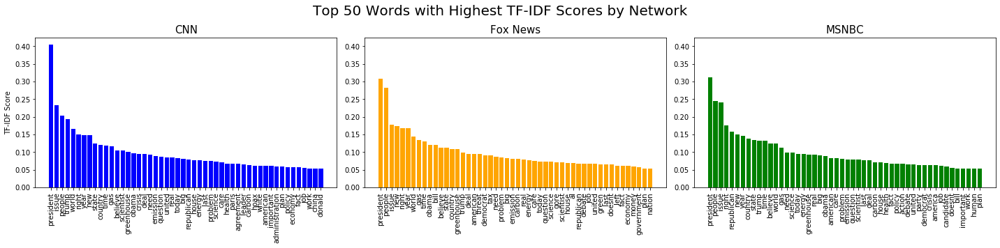

In [218]:
fig, axs = plt.subplots(1, 3, sharey=True, figsize=(20, 5))
fig.subplots_adjust(wspace=0.1)
fig.suptitle(suptitle, fontsize=20)
plt.setp(axs[0], ylabel='TF-IDF Score')
top_words_between_networks = set()
for i, network in enumerate(STATIONS):
    top_n_words_tfidf_for_network = top_n_words_tfidf_by_network[i]
    top_n_words_tfidf_dict = {term: tfidf for term, tfidf in top_n_words_tfidf_for_network}
    top_n_tfidf_words = list(map(lambda x: x[0],top_n_words_tfidf_for_network))
    top_words_between_networks.update(top_n_tfidf_words)
    top_n_tfidf_scores = list(map(lambda x: x[1],top_n_words_tfidf_for_network))
    title = f"{network}"
    ax = axs[i]
    ax.yaxis.set_tick_params(labelbottom=True)
    ax.bar(top_n_tfidf_words, top_n_tfidf_scores, color=COLOR_MAP[network])
    ax.set_xticklabels(top_n_tfidf_words, rotation=90, fontsize=10)
    ax.set_title(title, fontsize=15)
fig.tight_layout(rect=[0, 0, 1, 0.93])
fig.savefig(join(NETWORK_PLOT_DIR, 'network_tfidf.png'))
plt.show()

In [241]:
top_words_between_networks = top_words_between_networks - {'al', 'year', 'donald'} # remove redundant words or stopwords

In [242]:
top_words_between_networks

{'action',
 'administration',
 'agreement',
 'america',
 'american',
 'believe',
 'big',
 'bill',
 'candidate',
 'carbon',
 'care',
 'china',
 'country',
 'crisis',
 'deal',
 'debate',
 'democrat',
 'doesnt',
 'economy',
 'emission',
 'energy',
 'fact',
 'gas',
 'gore',
 'government',
 'green',
 'greenhouse',
 'health',
 'hoax',
 'house',
 'human',
 'important',
 'issue',
 'job',
 'last',
 'leader',
 'left',
 'money',
 'nation',
 'need',
 'new',
 'obama',
 'paris',
 'party',
 'people',
 'plan',
 'policy',
 'president',
 'problem',
 'question',
 'real',
 'republican',
 'right',
 'science',
 'scientist',
 'state',
 'tax',
 'threat',
 'time',
 'today',
 'trump',
 'united',
 'white',
 'work',
 'world'}

We now do a similar process of applying TF-IDF featurization by year (11 documents), this will uncover what words were important to each year. For 2009-2018, we construct a document for each year the same way, by filtering the DF by year, except 2019-2020, since 2020 only has January data, so we combine 2019 + 2020 as a single document


In [151]:
YEAR_DIR = join(TFIDF_PLOT_DIR, 'by_year')
first_10_years_documents = [create_document(get_data_by_year(corpus_df, year)['Snippet'].tolist()) for year in range(2009, 2019)]
final_years_document = create_document(final_years_df['Snippet'].tolist())
all_years_documents = first_10_years_documents + [final_years_document]
vectorized_document_array_years, features_array_years = fit_tfidf_vectorizer(all_years_documents)

In [152]:
cosine_similarity_matrix_years = cosine_similarity(vectorized_document_array_years)
years_txt_sizes = {'label_size': 15, 'title_size': 15, 'cbar_text_size': 15}

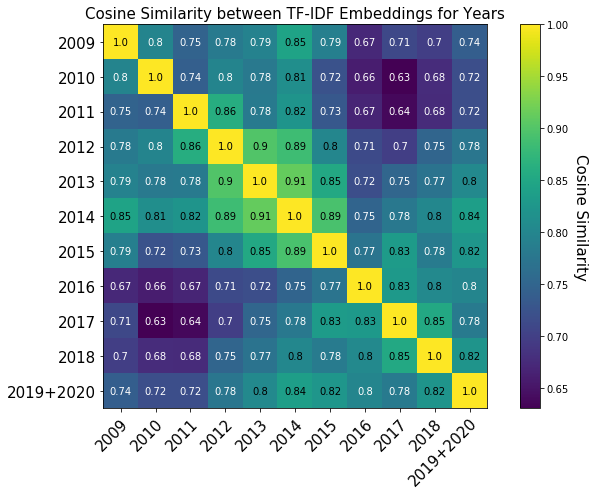

In [153]:
plot_cosine_similarity_heatmap(cosine_similarity_matrix_years, years, "Cosine Similarity between TF-IDF Embeddings for Years", years_txt_sizes, join(YEAR_DIR, 'years_cosine_similarity.png'))

In [154]:
top_n_words_tfidf_by_year = get_top_tfidf_words_per_document(n, vectorized_document_array_years, features_array_years)
suptitle = f"Top {n} Words with Highest TF-IDF Scores by Year"

In [ ]:
# Plot individual barplots and wordclouds
for year_i, top_n_words_year_i in zip(years, top_n_words_tfidf_by_year):
    top_n_words_tfidf_dict = {term: tfidf for term, tfidf in top_n_words_year_i}
    title = "Top {} Words with Highest TF-IDF Scores for {}".format(n, year_i)
    top_n_words_tfidf = list(map(lambda x: x[0], top_n_words_year_i))
    top_n_tfidf_scores = list(map(lambda x: x[1], top_n_words_year_i))
    plot_word_freq_scores(top_n_words_tfidf, top_n_tfidf_scores, title, 'TF-IDF Score', file_save_path=join(YEAR_DIR, f'top_{n}', 'barplots', f'{year_i}.png'))
    plot_word_cloud(top_n_words_tfidf_dict, title, title_font_size=28, file_save_path=join(YEAR_DIR, f'top_{n}', 'wordclouds', f'{year_i}.png'))

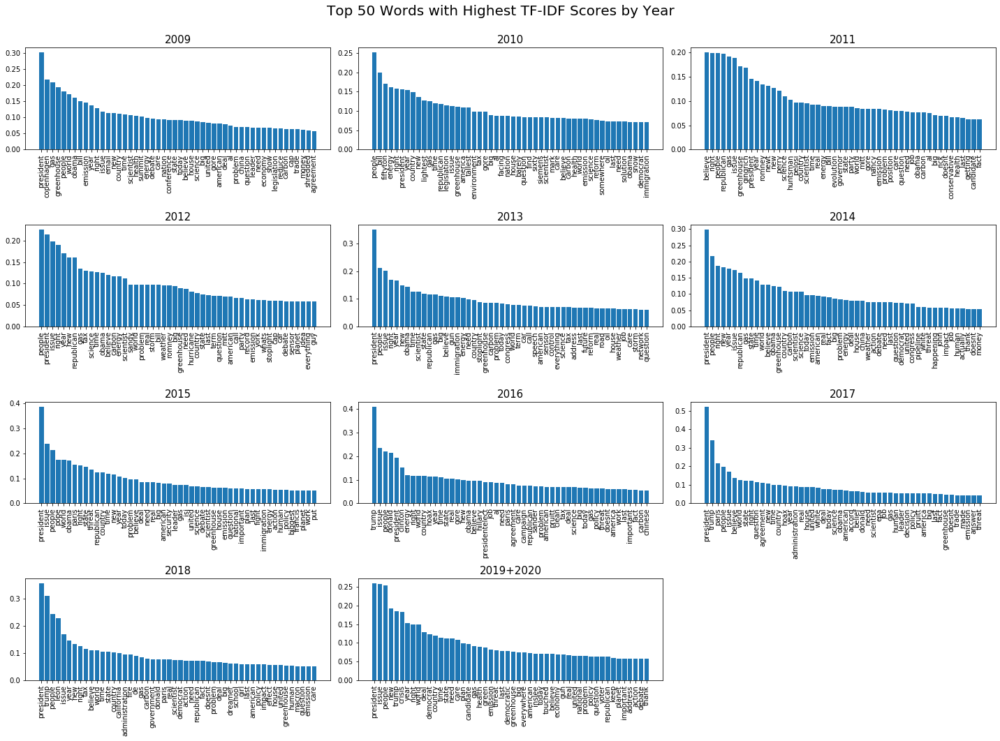

In [155]:
# Plot all barplots for all years in one figure
fig, axs = plt.subplots(4, 3, sharey=True, figsize=(20, 15))
fig.delaxes(axs[3, 2])
fig.suptitle(suptitle, fontsize=20)
plt.setp(axs[:, 0], ylabel='TF-IDF Score')
i = 0
for year_i, top_n_words_year_i in zip(years, top_n_words_tfidf_by_year):
    ax = plt.subplot(4, 3, i+1)
    top_n_words_tfidf_dict = {term: tfidf for term, tfidf in top_n_words_year_i}
    title = f"{year_i}"
    top_n_words_tfidf = list(map(lambda x: x[0], top_n_words_year_i))
    top_n_tfidf_scores = list(map(lambda x: x[1], top_n_words_year_i))
    ax.yaxis.set_tick_params(labelbottom=True)
    ax.bar(top_n_words_tfidf, top_n_tfidf_scores)
    ax.set_xticklabels(top_n_words_tfidf, rotation=90, fontsize=10)
    ax.set_title(title, fontsize=15)
    i += 1
fig.tight_layout(rect=[0, 0, 1, 0.95])
fig.savefig(join(YEAR_DIR, 'years_tfidf_bar_plots.png'))
plt.show()


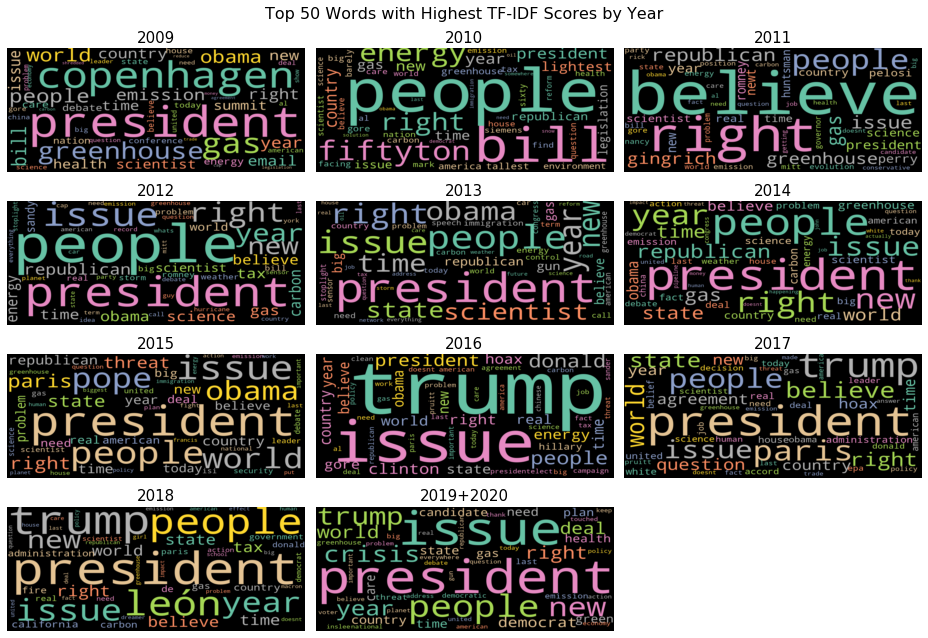

In [157]:
fig, axs = plt.subplots(4, 3, sharey=True, figsize=(13, 9))
fig.delaxes(axs[3, 2])
fig.suptitle(suptitle, fontsize=16)
plt.subplots_adjust(wspace=0.005)
i = 0
for year_i, top_n_words_year_i in zip(years, top_n_words_tfidf_by_year):
    top_n_words_tfidf_dict = {term: tfidf for term, tfidf in top_n_words_year_i}
    title = f"{year_i}"
    top_n_words_tfidf = list(map(lambda x: x[0], top_n_words_year_i))
    top_n_tfidf_scores = list(map(lambda x: x[1], top_n_words_year_i))
    ax = plt.subplot(4, 3, i+1)
    wc = WordCloud(background_color="black", scale=3, colormap='Set2', random_state=1)
    wc.generate_from_frequencies(top_n_words_tfidf_dict)
    plt.axis("off")
    ax.imshow(wc, interpolation='bilinear', aspect='auto')
    ax.set_title(title, fontsize=15)
    i += 1
fig.tight_layout(rect=[0, 0, 1, 0.96])
fig.savefig(join(YEAR_DIR, 'years_tfidf_wordclouds.png'))
plt.show()

### We now do the final TF-IDF calculation. We look at the documents created both by year and by network. This yields ~33 documents and allows to see who was saying what and in what year they were saying it.

In [120]:
NETWORK_AND_YEAR_DIR = join(TFIDF_PLOT_DIR, 'by_year_and_network')
all_years_with_network_documents = create_documents_by_years_and_by_network(corpus_df)
vectorized_document_array_years_and_networks, features_array_years_and_networks = fit_tfidf_vectorizer(all_years_with_network_documents)
all_networks_with_year_documents = create_documents_by_network_and_by_year(corpus_df)
vectorized_document_array_networks_and_years, features_array_networks_and_years = fit_tfidf_vectorizer(all_networks_with_year_documents)

In [26]:
cosine_similarity_matrix_years_and_networks = cosine_similarity(vectorized_document_array_years_and_networks)
cosine_similarity_matrix_networks_and_years = cosine_similarity(vectorized_document_array_networks_and_years)

In [190]:
year_networks_labels = [f'{STATIONS[i]} {year}' for year in years for i in range(3)]
network_years_labels = [f'{STATIONS[i]} {year}' for i in range(3) for year in years]
network_and_years_txt_sizes = {'label_size': 12, 'title_size': 20, 'cbar_text_size': 15}

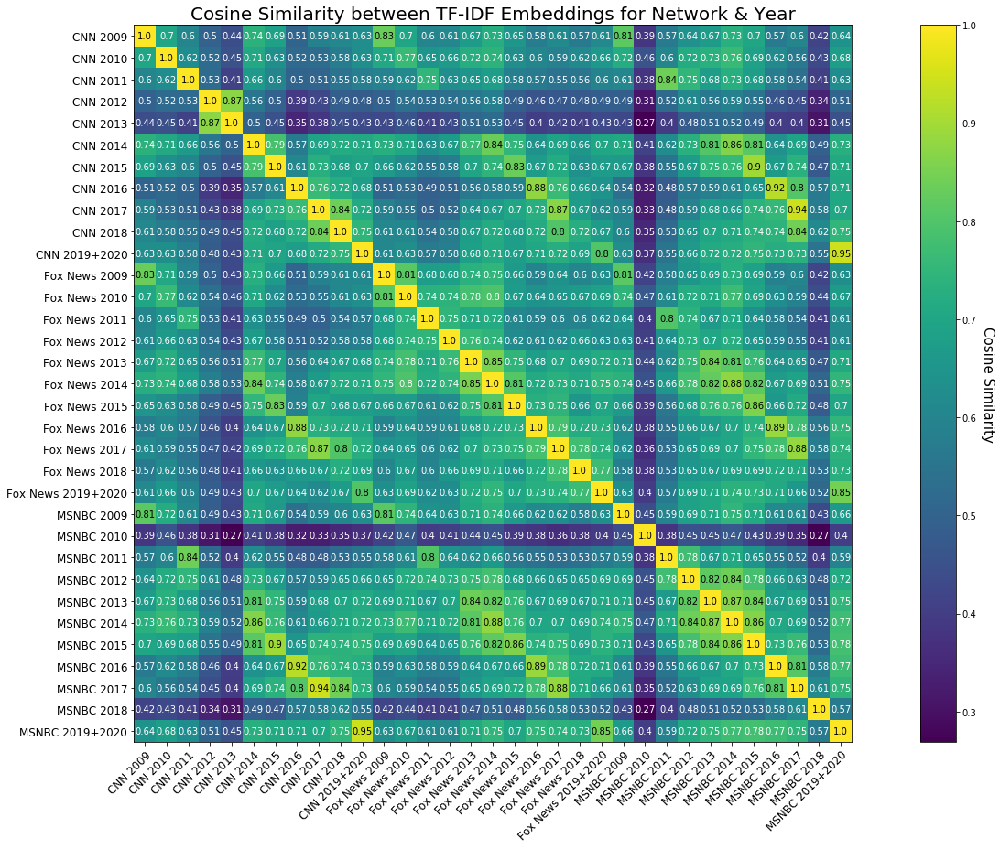

In [192]:
plot_cosine_similarity_heatmap(cosine_similarity_matrix_networks_and_years, network_years_labels, 
                               "Cosine Similarity between TF-IDF Embeddings for Network & Year", 
                               network_and_years_txt_sizes, 
                               join(NETWORK_AND_YEAR_DIR, 'networks_and_years_cosine_similarity.png'), 
                               figsize=(21, 13))

In [123]:
top_n_words_tfidf_by_year_and_network = get_top_tfidf_words_per_document(n, vectorized_document_array_years_and_networks, features_array_years_and_networks)
top_n_words_tfidf_by_network_and_year = get_top_tfidf_words_per_document(n, vectorized_document_array_networks_and_years, features_array_networks_and_years)
offset = 11
suptitle = f"Top {n} Words with Highest TF-IDF Score by Network and Year"

In [ ]:
# plot individual bar plots and word clouds
for i, year in zip(range(0, 33, 3), years):
    print('In the year {}, we find the top {} words with highest tf-idf scores for each network are:'.format(year, n))
    print('\n')
    for j, network in enumerate(STATIONS):
        tf_idf_idx = i + j
        word_list = top_n_words_tfidf_by_year_and_network[tf_idf_idx]
        top_n_words_tfidf_dict = {term: tfidf for term, tfidf in word_list}
        top_n_words_tfidf = list(map(lambda x: x[0], word_list))
        top_n_tfidf_scores = list(map(lambda x: x[1], word_list))
        title = "Top {} Words with Highest TF-IDF Scores for {} in {}".format(n, network, year)
        plot_word_freq_scores(top_n_words_tfidf, top_n_tfidf_scores, title, "TF-IDF Score", file_save_path=join(YEAR_AND_NETWORK_DIR, f'top_{n}', 'barplots', f'{year}_{NETWORK_MAP[network]}.png'))
        plot_word_cloud(top_n_words_tfidf_dict, title, title_font_size=25, file_save_path=join(YEAR_AND_NETWORK_DIR, f'top_{n}', 'wordclouds', f'{year}_{NETWORK_MAP[network]}.png'))
        

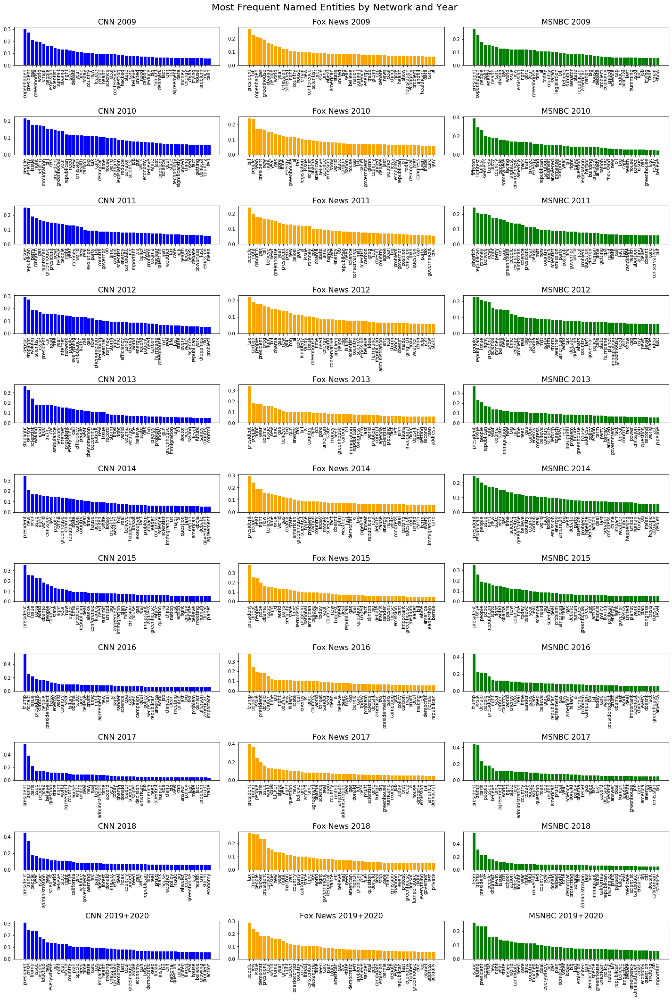

In [191]:
# generate barplots as one figure
fig, axs = plt.subplots(11, 3, figsize=(20, 30))
fig.suptitle(suptitle, fontsize=20)
for doc_idx, ax_title in enumerate(year_networks_labels):
    word_list = top_n_words_tfidf_by_year_and_network[doc_idx]
    top_n_words_tfidf_dict = {term: tfidf for term, tfidf in word_list}
    top_n_words_tfidf = list(map(lambda x: x[0], word_list))
    top_n_tfidf_scores = list(map(lambda x: x[1], word_list))
    ax = plt.subplot(11, 3, doc_idx + 1)
    ax.yaxis.set_tick_params(labelbottom=True)
    ax.bar(top_n_words_tfidf, top_n_tfidf_scores, color=COLOR_MAP[STATIONS[doc_idx % 3]])
    ax.set_xticklabels(top_n_words_tfidf, rotation=90, fontsize=10)
    ax.set_title(ax_title, fontsize=16)
    
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(join(NETWORK_AND_YEAR_DIR, 'networks_and_years_tfidf_barplots.png'))
plt.show()

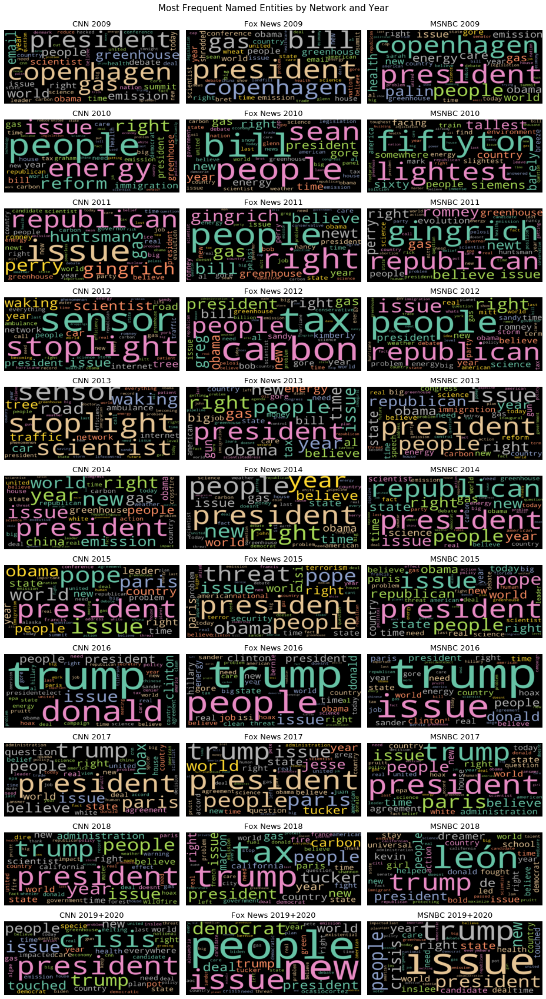

In [193]:
# generate wordclouds as one figure
fig, axs = plt.subplots(11, 3, figsize=(13, 24))
fig.suptitle(suptitle, fontsize=15)
for doc_idx, ax_title in enumerate(year_networks_labels):
    word_list = top_n_words_tfidf_by_year_and_network[doc_idx]
    top_n_words_tfidf_dict = {term: tfidf for term, tfidf in word_list}
    top_n_words_tfidf = list(map(lambda x: x[0], word_list))
    top_n_tfidf_scores = list(map(lambda x: x[1], word_list))
    ax = plt.subplot(11, 3, doc_idx + 1)
    wc = WordCloud(background_color="black", scale=3, colormap='Set2', random_state=1)
    wc.generate_from_frequencies(top_n_words_tfidf_dict)
    plt.axis("off")
    ax.imshow(wc, interpolation='bilinear', aspect='auto')
    ax.set_title(ax_title, fontsize=13)
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(join(NETWORK_AND_YEAR_DIR, 'networks_and_years_tfidf_wordclouds.png'))
plt.show()

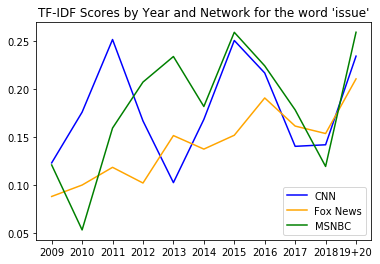

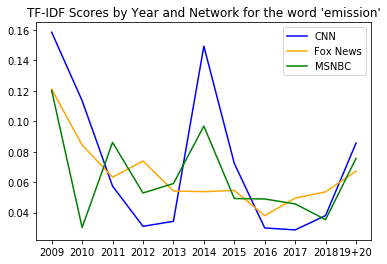

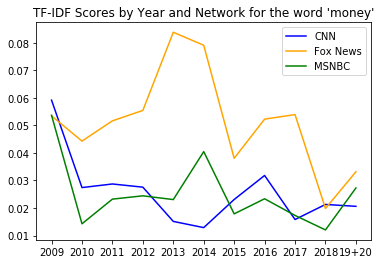

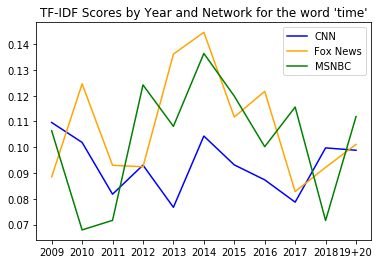

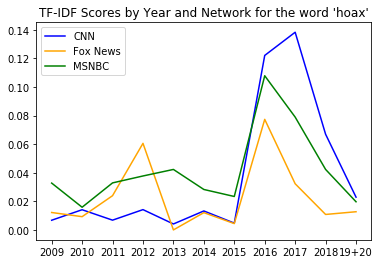

...

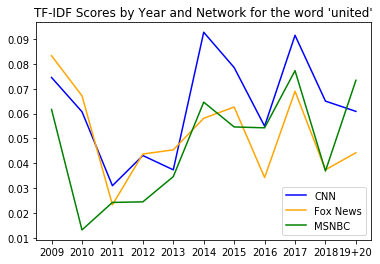

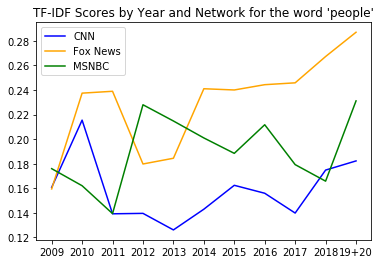

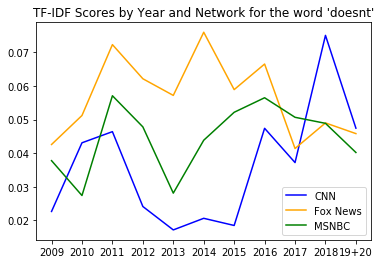

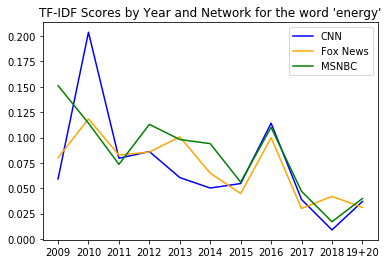

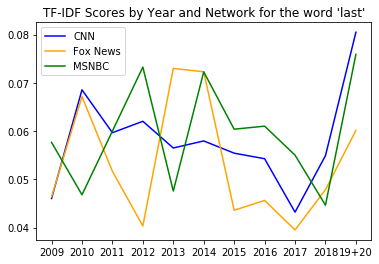

In [245]:
ylabel = 'TF-IDF Score'
title = "TF-IDF Scores by Year and Network for the word "
for word in top_words_between_networks:
    word_vector_networks_and_years = get_tfidf_for_word_across_docs(word, 
                                                                    vectorized_document_array_networks_and_years,
                                                                    features_array_networks_and_years)
    cnn_vector = word_vector_networks_and_years[:11] 
    fox_vector = word_vector_networks_and_years[11:22]
    msnbc_vector = word_vector_networks_and_years[22:]
    plt.plot(years_mod, cnn_vector, label=STATIONS[0], color=COLOR_MAP[STATIONS[0]])
    plt.plot(years_mod, fox_vector, label=STATIONS[1], color=COLOR_MAP[STATIONS[1]])
    plt.plot(years_mod, msnbc_vector, label=STATIONS[2], color=COLOR_MAP[STATIONS[2]])
    plt.legend()
    plt.title(title + f'\'{word}\'')
    plt.savefig(join(NETWORK_AND_YEAR_DIR, 'words', f'{word}.png'))
    plt.show()

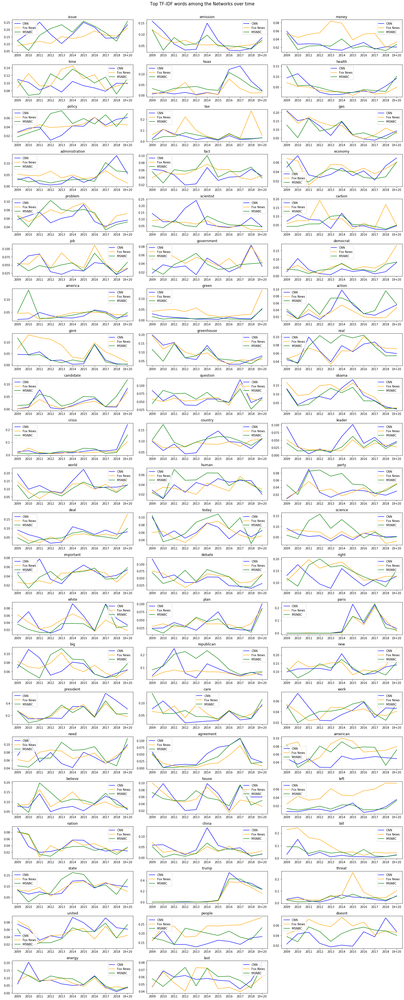

In [247]:
ylabel = 'TF-IDF Score'
suptitle = "Top TF-IDF words among the Networks over time"
# generate wordclouds as one figure
fig, axs = plt.subplots(22, 3, figsize=(20, 50))
fig.delaxes(axs[21, 2])
fig.suptitle(suptitle, fontsize=15)
for i, word in enumerate(top_words_between_networks):
    ax = plt.subplot(22, 3, i + 1)
    word_vector_networks_and_years = get_tfidf_for_word_across_docs(word, 
                                                                    vectorized_document_array_networks_and_years,
                                                                    features_array_networks_and_years)
    cnn_vector = word_vector_networks_and_years[:11] 
    fox_vector = word_vector_networks_and_years[11:22]
    msnbc_vector = word_vector_networks_and_years[22:]
    ax.plot(years_mod, cnn_vector, label=STATIONS[0], color=COLOR_MAP[STATIONS[0]])
    ax.plot(years_mod, fox_vector, label=STATIONS[1], color=COLOR_MAP[STATIONS[1]])
    ax.plot(years_mod, msnbc_vector, label=STATIONS[2], color=COLOR_MAP[STATIONS[2]])
    ax.legend()
    ax.set_title(f'{word}')
fig.tight_layout(rect = [0, 0, 1, 0.97])
fig.savefig(join(NETWORK_AND_YEAR_DIR, 'top_tfidf_between_networks_overtime.png'))
plt.show()

# Named Entity Recognition (NER)
#### We apply named entities recognition (NER) in order parse out important people, organizations, locations, and events over time as well. 

In [172]:
# Our original data did not have the proper casing. We use a python package truecase which is a pre-trained model which brings back the true case to our
# data. We do this so that the NER pre-trained models can more accurately parse out the Named Entities, if everything was lowercase as is the case with our data, the model would miss most entities.
NER_DIR = join('./plots/ner_analysis')
suptitle = "Most Frequent Named Entities by Network and Year"
unprocessed_corpus_df["Snippet"] = unprocessed_corpus_df["Snippet"].apply(lambda x: get_true_case(x))

In [163]:
unprocessed_docs_by_years_and_network = create_documents_by_years_and_by_network(unprocessed_corpus_df)

In [169]:
NER_top_n_freq_lists_list = []
NER_top_n_freq_dicts_list = []
for doc_idx in range(len(year_networks_labels)):
    doc = nlp(unprocessed_docs_by_years_and_network[doc_idx])
    named_entities_list = [entity.text for entity in doc.ents]
    named_entities_counter = Counter(named_entities_list)
    total_named_entities = sum([named_entities_counter[entity] for entity in named_entities_counter.elements()])
    top_n_named_entities_list = [(entity, freq/total_named_entities) for entity, freq in named_entities_counter.most_common(n)]
    NER_top_n_freq_lists_list.append(top_n_named_entities_list)
    top_n_entities_dict = {entity: rel_freq for entity, rel_freq in top_n_named_entities_list}
    NER_top_n_freq_dicts_list.append(top_n_entities_dict)

In [ ]:
# create indivdual plots for network and year
for i, year in zip(range(0, 33, 3), years):
    print('In the year {}, we find the top {} named entities with highest frequencies for each network are:'.format(year, n))
    print('\n')
    for j, network in enumerate(STATIONS):
        doc_idx = i + j
        top_n_named_entities_list = NER_top_n_freq_lists_list[doc_idx]
        top_n_entities_dict = NER_top_n_freq_dicts_list[doc_idx]
        title = "Top 30 Named Entities with Highest Frequency for {} in {}".format(network, year)
        top_n_named_entities = list(map(lambda x: x[0], top_n_named_entities_list))
        top_n_named_entities_freq = list(map(lambda x: x[1], top_n_named_entities_list))
        plot_word_freq_scores(top_n_named_entities, top_n_named_entities_freq, title, ylabel="Frequency of Word", file_save_path=join(NER_DIR, 'barplots', f'{year}_{NETWORK_MAP[network]}.png'))
        plot_word_cloud(top_n_entities_dict, title, title_font_size=25, file_save_path=join(NER_DIR, 'wordclouds', f'{year}_{NETWORK_MAP[network]}.png'))
        

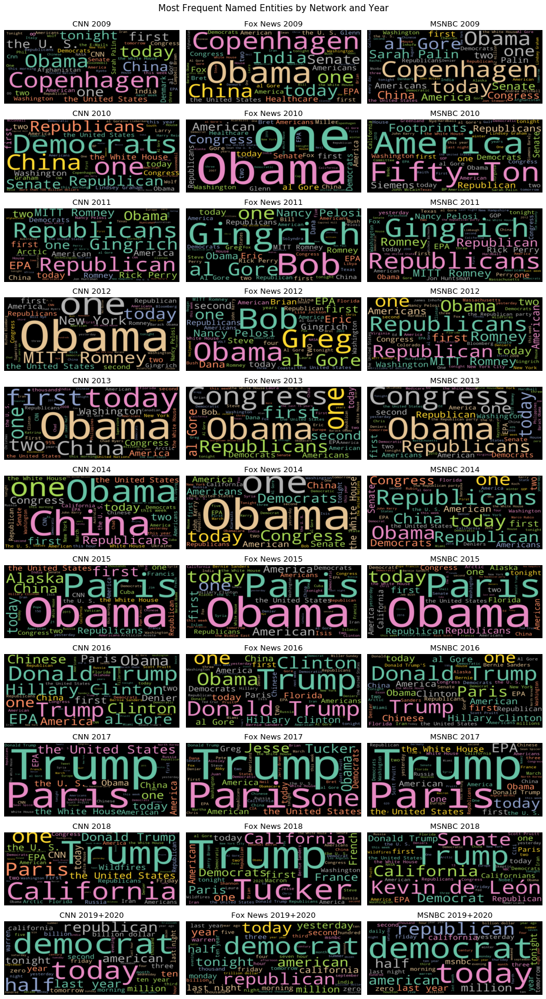

In [195]:
# generate wordclouds as one figure
fig, axs = plt.subplots(11, 3, figsize=(13, 24))
fig.suptitle(suptitle, fontsize=15)
for doc_idx, ax_title in enumerate(year_networks_labels):
    top_n_named_entities_list = NER_top_n_freq_lists_list[doc_idx]
    top_n_named_entities_dict = NER_top_n_freq_dicts_list[doc_idx]
    top_n_named_entities = list(map(lambda x: x[0], top_n_named_entities_list))
    top_n_named_entities_freq = list(map(lambda x: x[1], top_n_named_entities_list))
    ax = plt.subplot(11, 3, doc_idx + 1)
    wc = WordCloud(background_color="black", scale=3, colormap='Set2', random_state=1)
    wc.generate_from_frequencies(top_n_named_entities_dict)
    plt.axis("off")
    ax.imshow(wc, interpolation='bilinear', aspect='auto')
    ax.set_title(ax_title, fontsize=13)
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(join(NER_DIR, 'networks_and_years_NER_freq_wordclouds.png'))
plt.show()

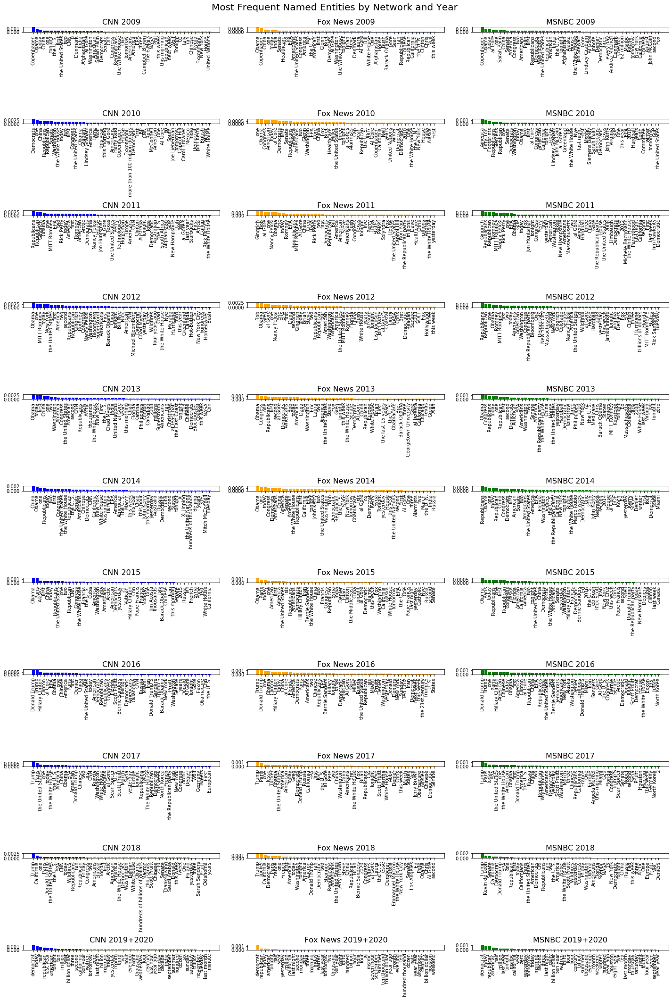

In [197]:
# generate barplots as one figure
fig, axs = plt.subplots(11, 3, figsize=(20, 30))
fig.suptitle(suptitle, fontsize=20)
# fig.subplots_adjust(hspace=1.3)
for doc_idx, ax_title in enumerate(year_networks_labels):
    top_n_named_entities_list = NER_top_n_freq_lists_list[doc_idx]
    top_n_named_entities = list(map(lambda x: x[0], top_n_named_entities_list))
    top_n_named_entities_freq = list(map(lambda x: x[1], top_n_named_entities_list))
    ax = plt.subplot(11, 3, doc_idx + 1)
    ax.yaxis.set_tick_params(labelbottom=True)
    ax.bar(top_n_named_entities, top_n_named_entities_freq, color=COLOR_MAP[STATIONS[doc_idx % 3]])
    ax.set_xticklabels(top_n_named_entities, rotation=90, fontsize=10)
    ax.set_title(ax_title, fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(join(NER_DIR, 'networks_and_years_NER_freq_barplots.png'))
plt.show()